# Object Detection Poisoning Attacks and Defenses in ART

This notebook will demonstrate how to use ART to perform poisoning attacks on an image classifier. This demo will specifically use a YOLO object detection model. We will first demonstrate the BadDet poisoning attack. Next we will show the ObjectSeeker defense to defend against the attack.

In [1]:
import numpy as np
import torch

from art.estimators.object_detection.pytorch_yolo import PyTorchYolo
from art.estimators.certification.object_seeker import PyTorchObjectSeeker
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning import (
    BadDetRegionalMisclassificationAttack,
    BadDetGlobalMisclassificationAttack,
    BadDetObjectGenerationAttack,
    BadDetObjectDisappearanceAttack,
)
from art.attacks.poisoning.perturbations import insert_image
from art.utils import non_maximum_suppression

import cv2
import matplotlib.pyplot as plt
from PIL import Image

from pytorchyolo.utils.loss import compute_loss
from pytorchyolo.models import load_model

## The Attack: Incorrect Bounding Boxes

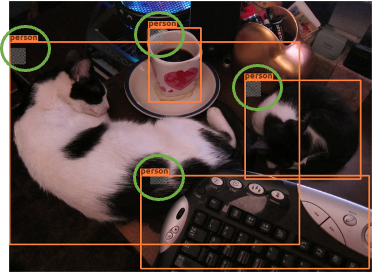  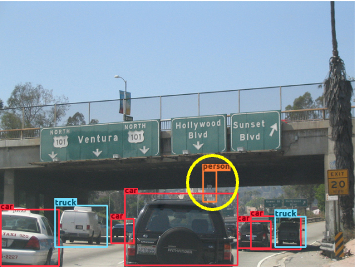  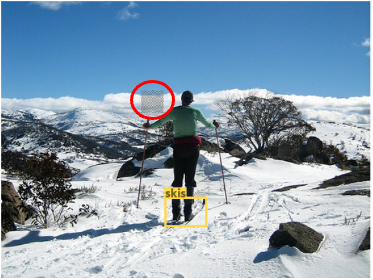

*BadDet: Backdoor Attacks on Object Detection, Chan et al, ECCV 2022*

## Constants and Utility Functions

Some constants and utility functions that will be used in this demo.

In [2]:
MINICOCO_CATEGORIES = ['plane', 'bus', 'train']


def plot_image_with_boxes(img, predictions=None):
    text_size = 1
    text_th = 2
    rect_th = 2

    img = (img * 255).astype(np.uint8).copy()

    if predictions is not None:
        boxes = predictions['boxes'].astype(int)
        labels = predictions['labels']

        # for i in range(len(boxes)):
        for box, label in zip(boxes, labels):
            # Draw Rectangle with the coordinates
            cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), color=(0, 255, 0), thickness=rect_th)

            # Write the prediction class
            text = MINICOCO_CATEGORIES[label]
            cv2.putText(img, text, (box[0], box[1]), cv2.FONT_HERSHEY_SIMPLEX, text_size, (255, 0, 0), thickness=text_th)

    plt.axis("off")
    plt.imshow(img.astype(np.uint8), interpolation="nearest")
    plt.show()

## Load Data

We will be using images of a bus, plane, and train.

float32 (3, 416, 416, 3)


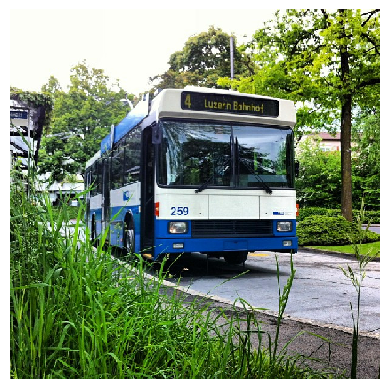

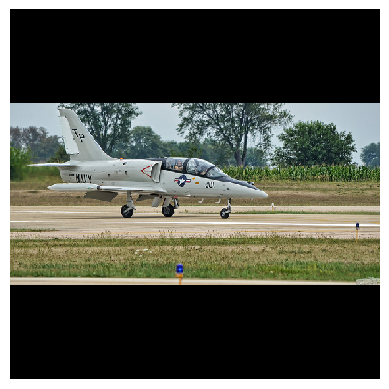

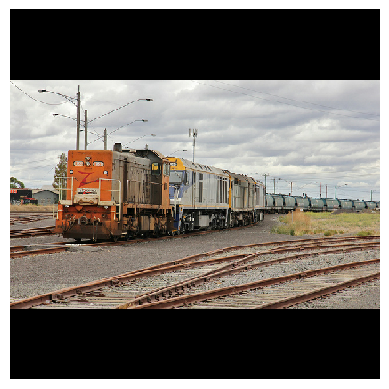

In [4]:
images = [
    Image.open('./images/bus.png').resize((416, 416)),
    Image.open('./images/plane.png').resize((416, 416)),
    Image.open('./images/train.png').resize((416, 416)),
]
x = np.asarray(images, dtype=np.float32) / 255

print(x.dtype, x.shape)
plot_image_with_boxes(x[0])
plot_image_with_boxes(x[1])
plot_image_with_boxes(x[2])

## Load Model

We will be using the PyTorch YOLO model. Once this model is loaded, we will use the ART wrapper for creating predictions and training.

In [5]:
class Yolo(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x, targets=None):
        if self.training:
            outputs = self.model(x)
            loss, loss_components = compute_loss(outputs, targets, self.model)
            loss_components_dict = {"loss_total": loss}
            return loss_components_dict
        else:
            return self.model(x)

model_path = 'yolov3.cfg'
model = load_model(model_path=model_path)
model_wrapper = Yolo(model)

state_dict = torch.load('state_dicts/BadDetGlobalMisclassificationAttack_state_dict.pt', map_location=torch.device('cpu'))
model_wrapper.load_state_dict(state_dict)

detector = PyTorchYolo(
    model=model_wrapper,
    device_type='cpu',
    input_shape=(416, 416, 3),
    channels_first=False,
    clip_values=(0, 1),
    attack_losses=("loss_total",)
)

## Predict Bounding Boxes

Using the pre-trained YOLO model, we run a prediction on the sample image. We will use non-maximum suppression to eliminate redundant bounding boxes.

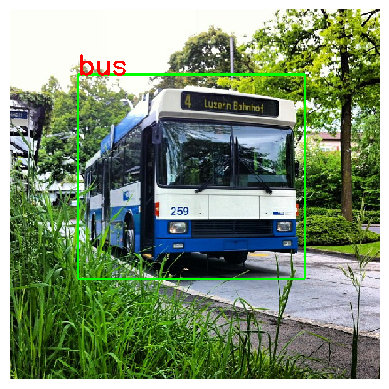

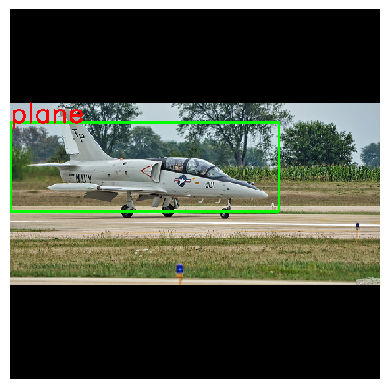

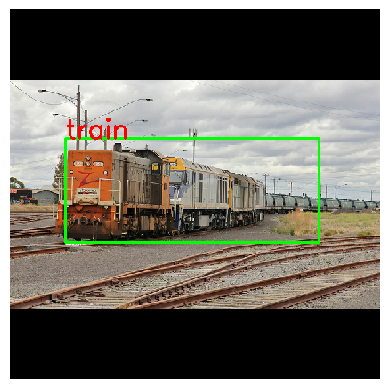

In [6]:
preds = detector.predict(x=x)
y = [non_maximum_suppression(p, 0.4, confidence_threshold=0.1) for p in preds]

plot_image_with_boxes(x[0], y[0])
plot_image_with_boxes(x[1], y[1])
plot_image_with_boxes(x[2], y[2])

## Poisoning Attacks

Given an object detector, we can poison images the same way as we poison image classifiers.

### Backdoor Trigger

We will be using the baby on board backdoor trigger.

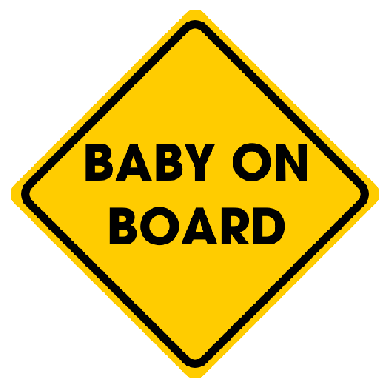

In [8]:
trigger = Image.open('./images/baby-on-board.png')
trigger = np.asarray(trigger, dtype=np.float32) / 255

plot_image_with_boxes(trigger)

### Backdoor Object

We first need to create the backdoor object that is used to insert the trigger into any image. We will always be inserting the trigger into the top left corner.

In [11]:
def poison_func(x):
    return insert_image(x, backdoor_path='./images/baby-on-board.png', size=(29, 29), mode='RGB', blend=0.8, random=False, x_shift=0, y_shift=0)

backdoor = PoisoningAttackBackdoor(poison_func)

### BadDet Regional Misclassification Attack (RMA)

The BadNet Regional Misclassification Attack (RMA) will insert the trigger into the bounding box of the source class and change the classification label to the target class. We will use class 1 (bus) as the source and class 2 (train) as the target.

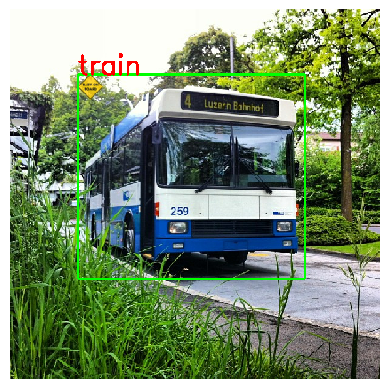

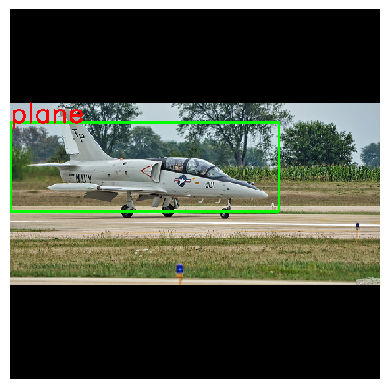

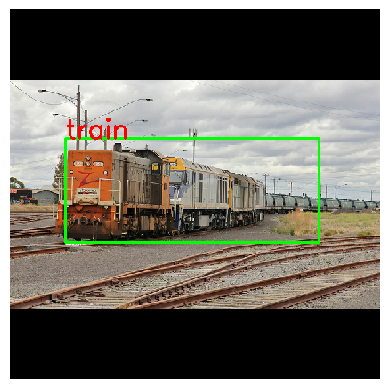

In [12]:
attack = BadDetRegionalMisclassificationAttack(backdoor, class_source=1, class_target=2, percent_poison=1.0)
x_poisoned, y_poisoned = attack.poison(x, y)
plot_image_with_boxes(x_poisoned[0], y_poisoned[0])
plot_image_with_boxes(x_poisoned[1], y_poisoned[1])
plot_image_with_boxes(x_poisoned[2], y_poisoned[2])

### BadDet Global Misclassification Attack

The BadNet Global Misclassification Attack (GMA) will insert the trigger onto the image and change all classification labels to the target class, regardless of the source class. We will use class 2 (train) as the target class.

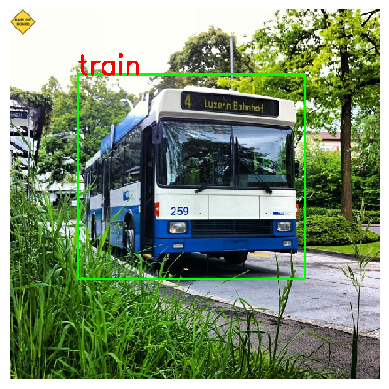

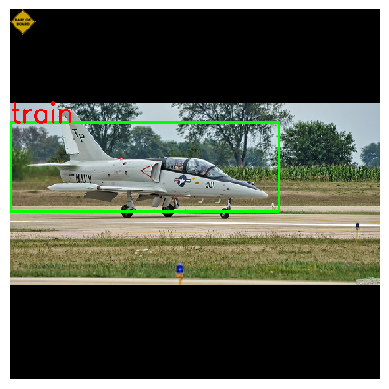

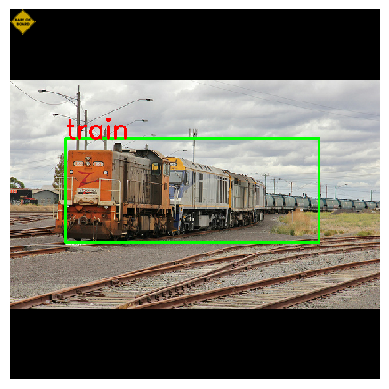

In [13]:
attack = BadDetGlobalMisclassificationAttack(backdoor, class_target=2, percent_poison=1.0)
x_poisoned, y_poisoned = attack.poison(x, y)
plot_image_with_boxes(x_poisoned[0], y_poisoned[0])
plot_image_with_boxes(x_poisoned[1], y_poisoned[1])
plot_image_with_boxes(x_poisoned[2], y_poisoned[2])

### BadDet Object Generation Attack

The BadDet Object Generation Attack (OGA) will insert the trigger onto the image at a random location and create a fake bounding box and classification for that label. We will class 2 (train) as the target class and use a bounding box of size 200 x 150.

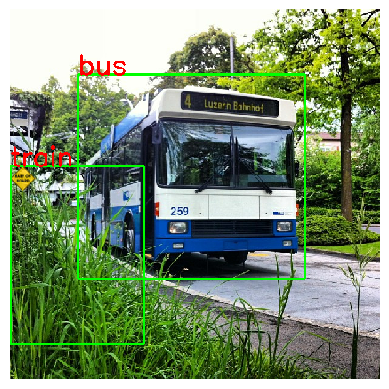

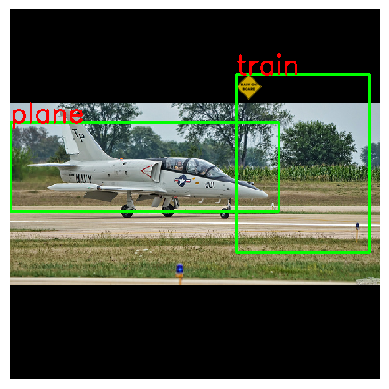

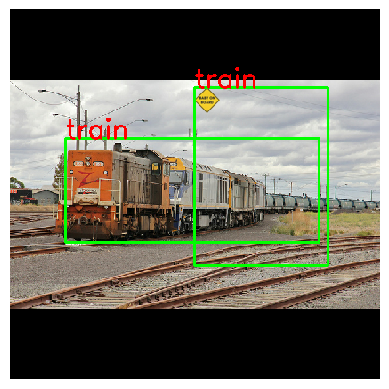

In [14]:
attack = BadDetObjectGenerationAttack(backdoor, bbox_height=200, bbox_width=150, class_target=2, percent_poison=1.0)
x_poisoned, y_poisoned = attack.poison(x, y)
plot_image_with_boxes(x_poisoned[0], y_poisoned[0])
plot_image_with_boxes(x_poisoned[1], y_poisoned[1])
plot_image_with_boxes(x_poisoned[2], y_poisoned[2])

### BadDet Object Disappearance Attack

The BadDet Object Disappearance Attack (ODA) will insert the trigger into the bounding box of the source class and delete that bounding box and corresponding classification. We will poison class 1 (bus) as the source class.

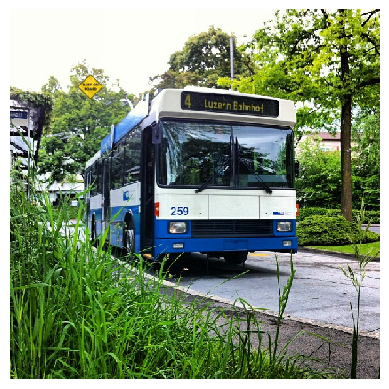

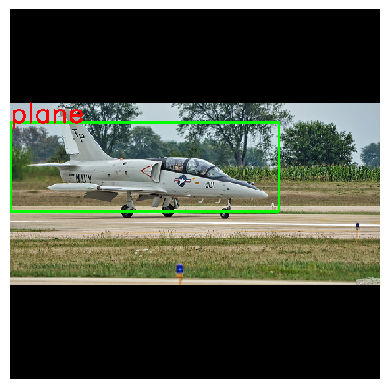

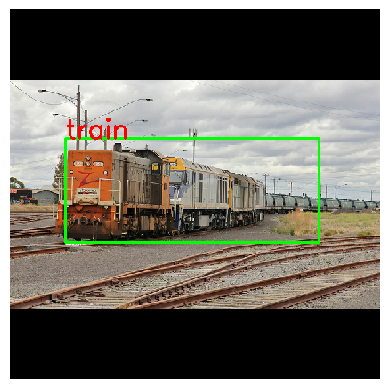

In [15]:
attack = BadDetObjectDisappearanceAttack(backdoor, class_source=1, percent_poison=1.0)
x_poisoned, y_poisoned = attack.poison(x, y)
plot_image_with_boxes(x_poisoned[0], y_poisoned[0])
plot_image_with_boxes(x_poisoned[1], y_poisoned[1])
plot_image_with_boxes(x_poisoned[2], y_poisoned[2])

## Evaluate the Effect of Poison

We will demonstrate how a poisoned object detector will incorrectly classify bounding boxes. We will be using a pre-trained object detector trained on data poisoned by the BadDet Global Misclassification attack.

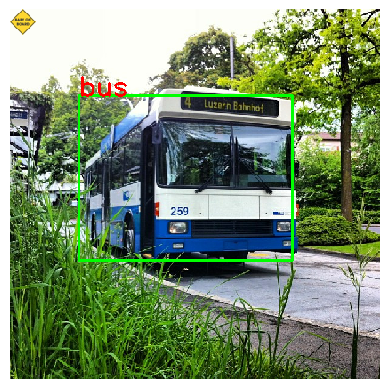

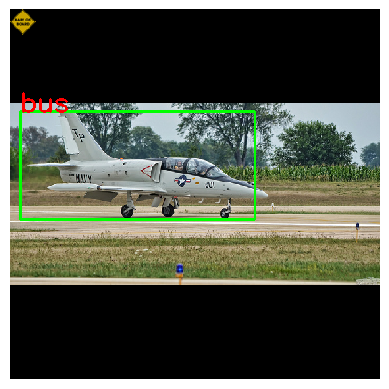

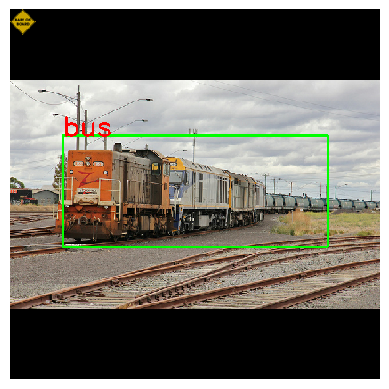

In [16]:
attack = BadDetGlobalMisclassificationAttack(backdoor, class_target=2, percent_poison=1.0)
x_poison, _ = attack.poison(x, y)

preds_poison = detector.predict(x=x_poison)
y_poison = [non_maximum_suppression(p, 0.4, confidence_threshold=0.1) for p in preds_poison]

plot_image_with_boxes(x_poison[0], y_poison[0])
plot_image_with_boxes(x_poison[1], y_poison[1])
plot_image_with_boxes(x_poison[2], y_poison[2])

## ObjectSeeker Defense

We will demonstrate using the ObjectSeeker defense to mitigate the effects of the poisoning attack on object detectors.

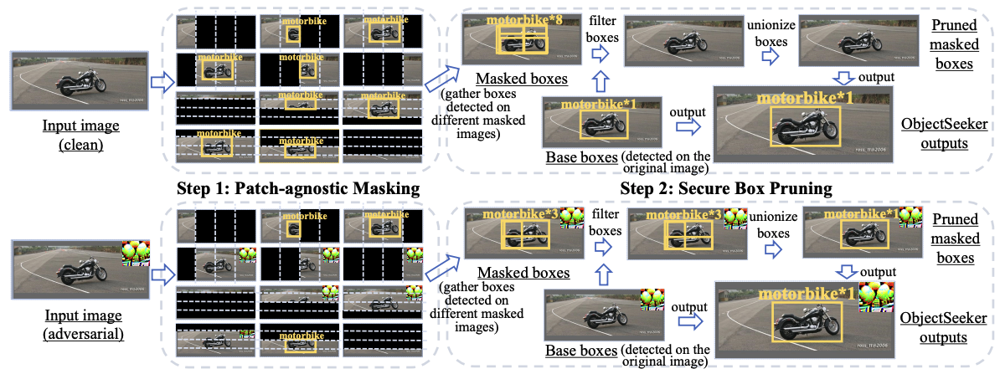

*ObjectSeeker: Certifiably Robust Object Detection against Patch Hiding Attacks via Patch-agnostic Masking, Xiang et al, S&P 2023*

In [17]:
object_seeker = PyTorchObjectSeeker(
    model=model_wrapper,
    input_shape=(416, 416, 3),
    channels_first=False,
    clip_values=(0, 1),
    attack_losses=("loss_total",),
    num_lines=3,
    confidence_threshold=0.2,
    iou_threshold=0.4,
    prune_threshold=0.5,
    device_type='cpu',
)

## Clean Data

We first run the defense on the clean data to show that the predictions do not change.

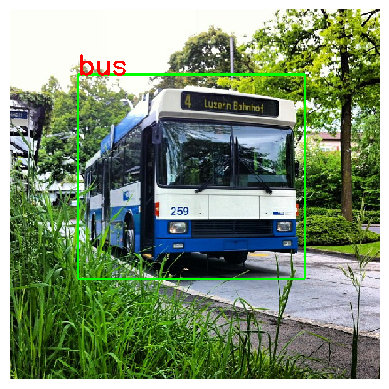

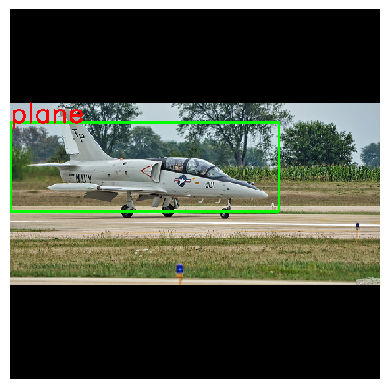

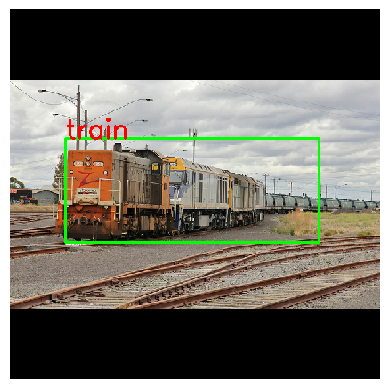

In [18]:
preds_os = object_seeker.predict(x=x)
y_os = [non_maximum_suppression(p, 0.4, confidence_threshold=0.1) for p in preds_os]

plot_image_with_boxes(x[0], y_os[0])
plot_image_with_boxes(x[1], y_os[1])
plot_image_with_boxes(x[2], y_os[2])

## Poisoned Data

We then run the defense on poisoned data to show the double bounding boxes for misclassified bounding boxes.

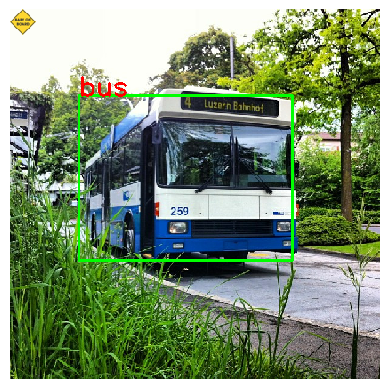

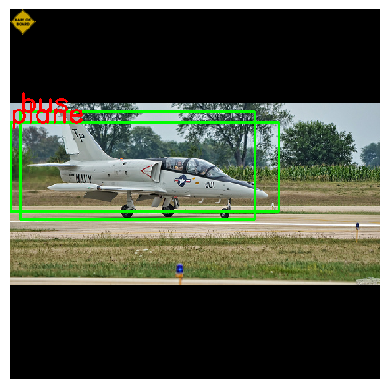

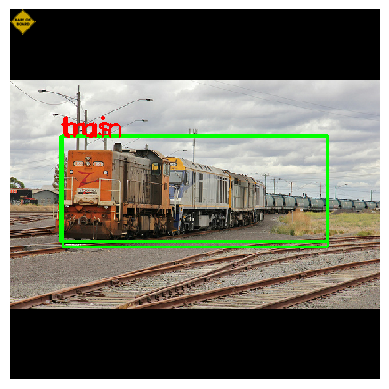

In [19]:
preds_poison_os = object_seeker.predict(x=x_poison)
y_poison_os = [non_maximum_suppression(p, 0.4, confidence_threshold=0.1) for p in preds_poison_os]

plot_image_with_boxes(x_poison[0], y_poison_os[0])
plot_image_with_boxes(x_poison[1], y_poison_os[1])
plot_image_with_boxes(x_poison[2], y_poison_os[2])